In [1]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import poppy

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = False

import warnings
warnings.filterwarnings("ignore")

from prop_models import coro, agpm
import misc_funs as misc
reload(coro)

wavelength_c = 750e-9*u.m

reload(agpm)
vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3.65*u.mm/2, gray_pixel=False)


DEBUG:poppy:Skipping oversampling, oversample < 1 or already padded 


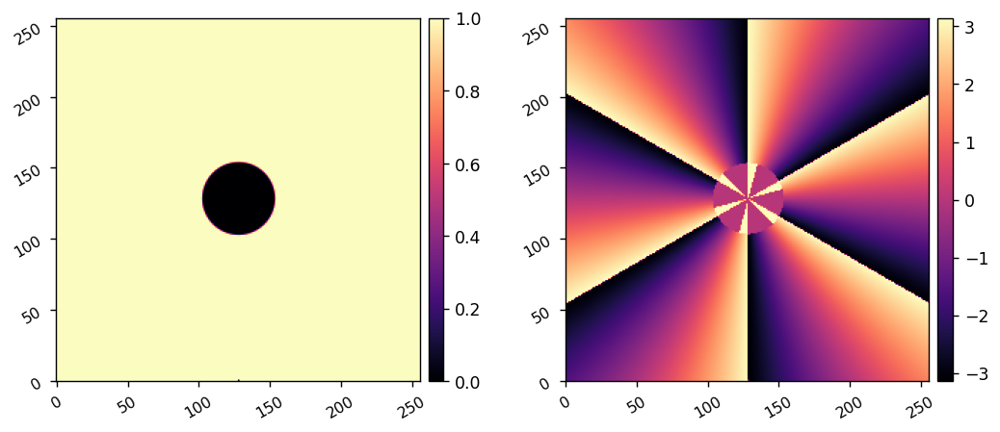

In [2]:
reload(agpm)
vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
wave = poppy.FresnelWavefront(wavelength=wavelength_c, beam_radius=50*u.um, npix=256, oversample=1)
vvc_phasor = vortex.get_phasor(wave)
misc.imshow2(np.abs(vvc_phasor), np.angle(vvc_phasor))

INFO:poppy:Loaded influence function from inf.fits for DM
DEBUG:poppy:Initialized: OAP1, fl =2.00e-01 m
DEBUG:poppy:Initialized: OAP2, fl =2.00e-01 m
DEBUG:poppy:Initialized: OAP3, fl =5.00e-01 m
DEBUG:poppy:Initialized: OAP4, fl =3.50e-01 m
DEBUG:poppy:Initialized: OAP5, fl =2.00e-01 m
INFO:poppy:Initialized OpticalSystem: unnamed system
INFO:poppy:Added optic: Circle, radius=5.1 mm after separation: 0.00e+00 m 
INFO:poppy:Added optic: OTE WFE Place-holder after separation: 0.00e+00 m 
INFO:poppy:Added optic: DM after separation: 0.00e+00 m 
INFO:poppy:Added optic: OAP1 after separation: 2.00e+02 mm 
INFO:poppy:Added optic: Circle, radius=6.35 mm after separation: 0.00e+00 m 
INFO:poppy:Added optic: Int Focal Plane after separation: 2.00e+02 mm 
INFO:poppy:Added optic: OAP2 after separation: 2.00e+02 mm 
INFO:poppy:Added optic: Circle, radius=6.35 mm after separation: 0.00e+00 m 
INFO:poppy:Added optic: Apodizer Place-holder after separation: 2.00e+02 mm 
INFO:poppy:Added optic: OAP3 

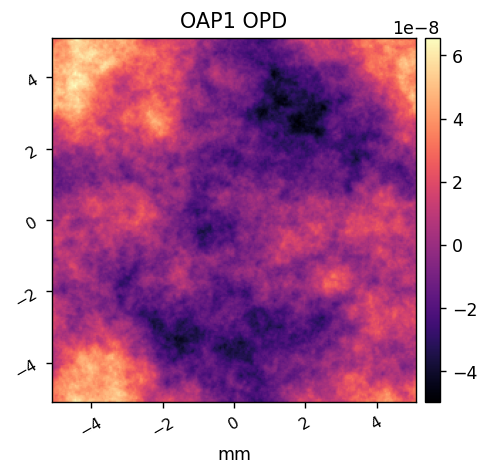

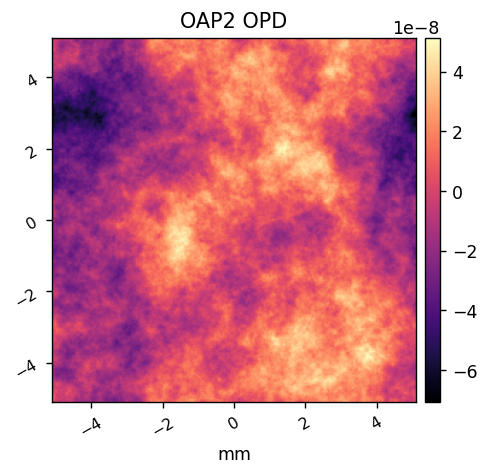

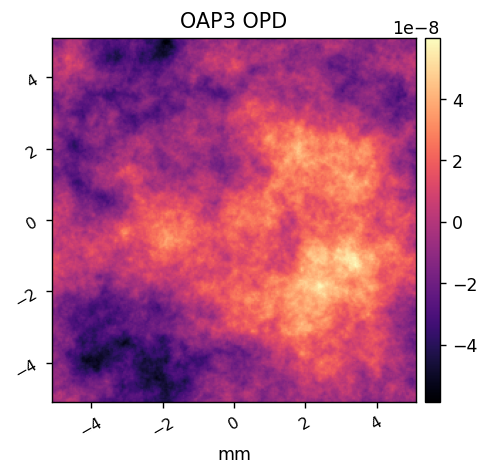

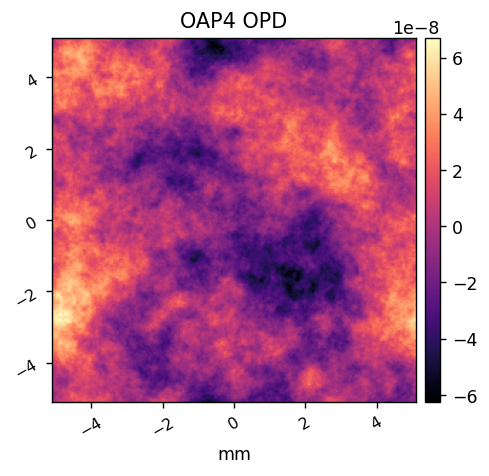

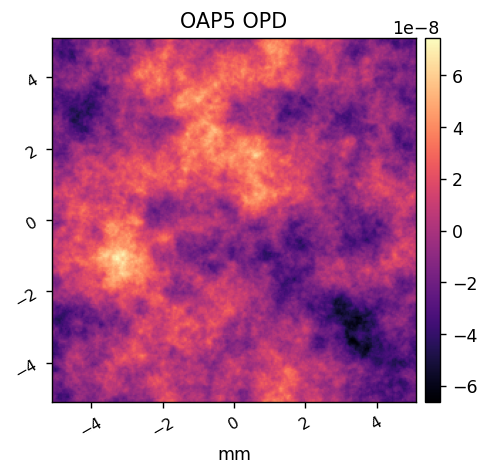

In [3]:
reload(coro)
c = coro.CORO()
c.show_opds()

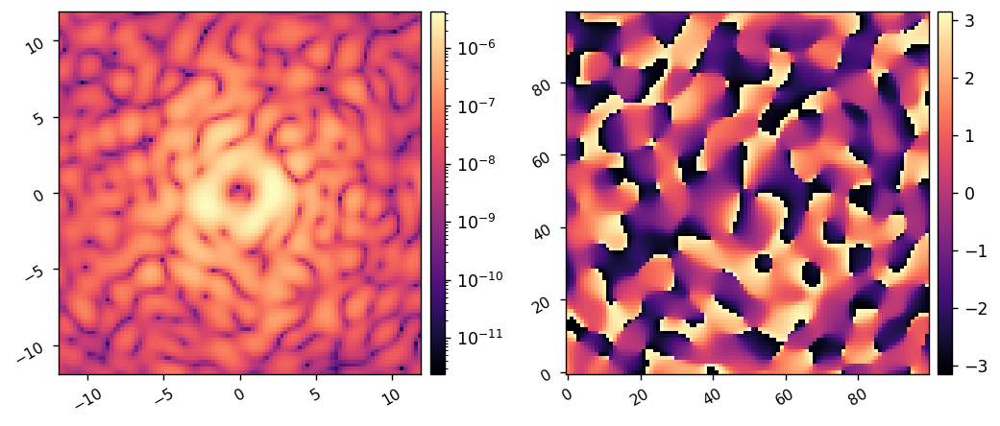

In [4]:
reload(coro)
reload(misc)
poppy_log.disabled = True

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = coro.CORO(npix=128, oversample=16, npsf=100,
              use_opds=True,
              FPM=vortex,
              LYOT=lyot_stop,
             )

psf = c.calc_psf()
misc.imshow2(np.abs(psf)**2, np.angle(psf),
             pxscl1=c.psf_pixelscale_lamD, lognorm1=True)



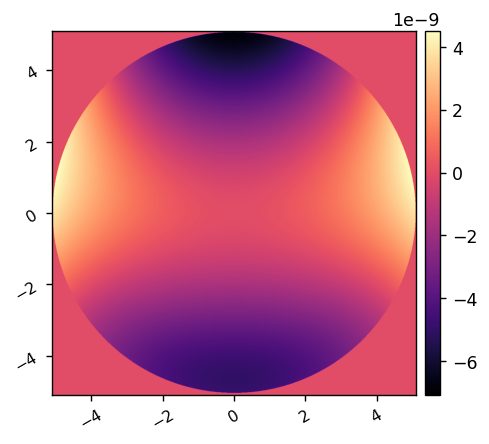

In [5]:
hdr = fits.getheader('wfe_on_axis.fits')
wfe = poppy.FITSOpticalElement(opd='wfe_on_axis.fits', opdunits='meters',
                               pixelscale=c.pupil_diam.to_value(u.m)/hdr['NAXIS1'])
misc.imshow1(wfe.opd, pxscl=wfe.pixelscale.to(u.mm/u.pix))

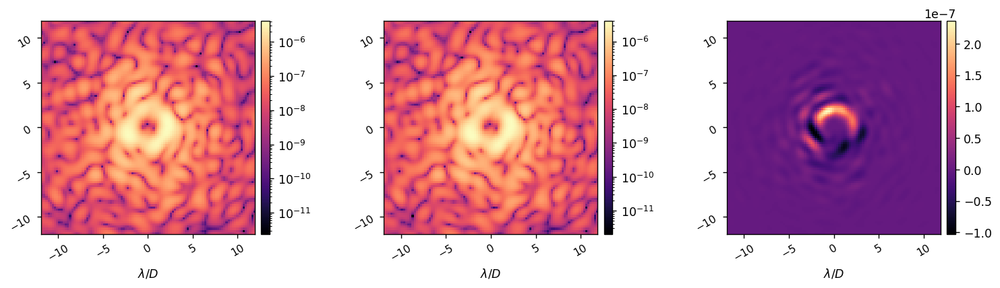

In [7]:
reload(coro)
reload(misc)
poppy_log.disabled = True

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = coro.CORO(npix=128, oversample=16, npsf=100,
              use_opds=True,
              FPM=vortex,
              LYOT=lyot_stop,
             )

c.OTEWFE = None
im1 = c.snap()

c.OTEWFE = wfe
im2 = c.snap()

diff = im1-im2

misc.imshow3(im1, im2, diff,
             pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$',
             lognorm1=True, lognorm2=True,
             wspace=0.5)



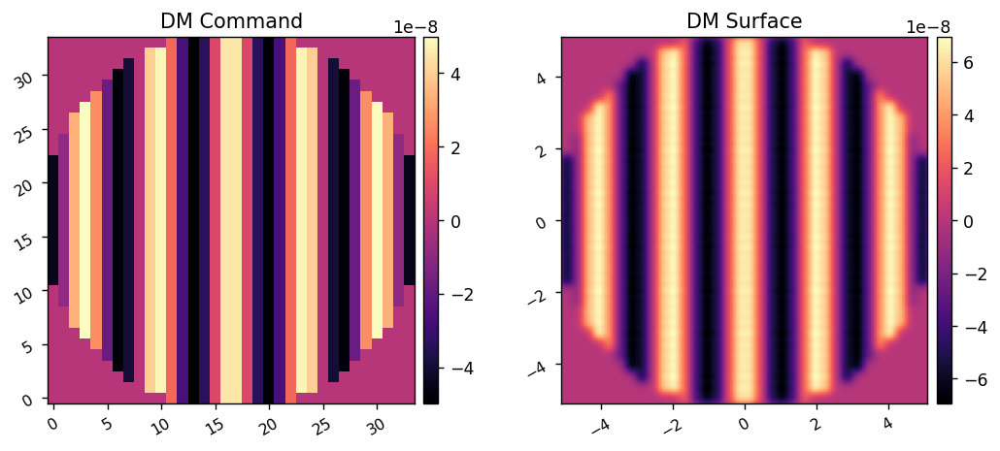

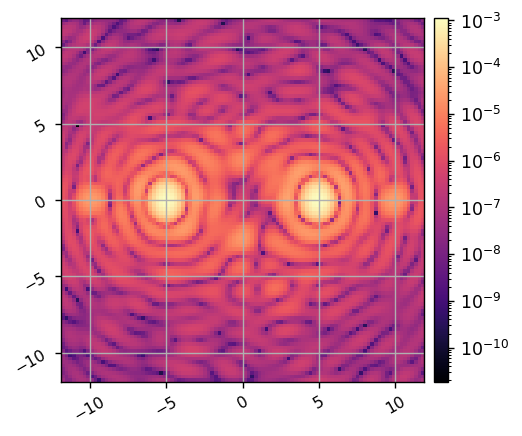

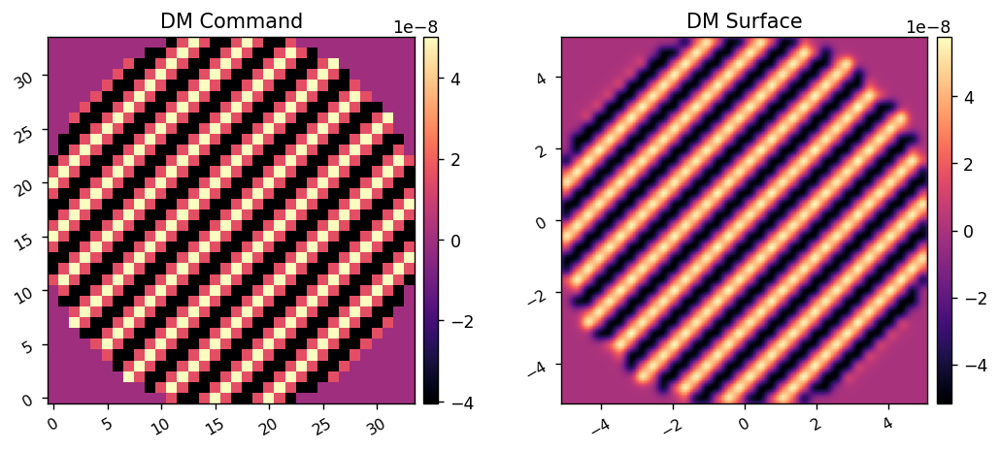

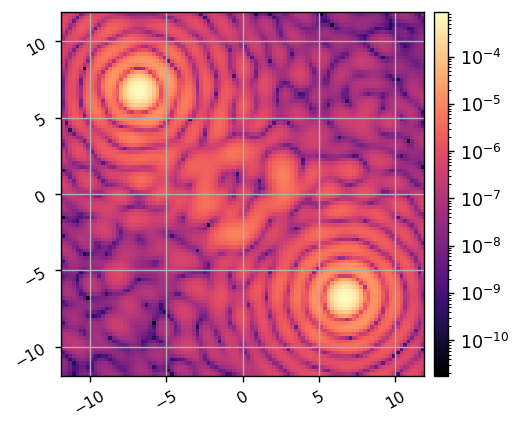

In [8]:
reload(coro)
Nact = c.Nact

xpp = np.linspace(-c.Nact/2, c.Nact/2-1, c.Nact) + 1/2
ppx, ppy = np.meshgrid(xpp,xpp)

separation = 5

amp = 5e-8
com_1 = amp*np.cos(2*np.pi*ppx*separation/Nact)*c.dm_mask
com_2 = amp*np.cos(2*np.pi*(ppx - ppy)/separation)*c.dm_mask

c.set_dm(com_1)
c.show_dm()
im1 = c.snap()
misc.imshow1(im1, pxscl=c.psf_pixelscale_lamD, lognorm=True, grid=True)

c.set_dm(com_2)
c.show_dm()
im2 = c.snap()
misc.imshow1(im2, pxscl=c.psf_pixelscale_lamD, lognorm=True, grid=True)

INFO:poppy:Loaded influence function from inf.fits for DM
DEBUG:poppy:Initialized: OAP1, fl =2.00e-01 m
DEBUG:poppy:Initialized: OAP2, fl =2.00e-01 m
DEBUG:poppy:Initialized: OAP3, fl =5.00e-01 m
DEBUG:poppy:Initialized: OAP4, fl =3.50e-01 m
DEBUG:poppy:Initialized: OAP5, fl =2.00e-01 m
INFO:poppy:Initialized OpticalSystem: unnamed system
INFO:poppy:Added optic: Circle, radius=5.1 mm after separation: 0.00e+00 m 
INFO:poppy:Added optic: DM after separation: 0.00e+00 m 
INFO:poppy:Added optic: OAP1 after separation: 2.00e+02 mm 
INFO:poppy:Added optic: Circle, radius=6.35 mm after separation: 0.00e+00 m 
INFO:poppy:Added optic: OAP1 OPD after separation: 0.00e+00 m 
INFO:poppy:Added optic: Int Focal Plane after separation: 2.00e+02 mm 
INFO:poppy:Added optic: OAP2 after separation: 2.00e+02 mm 
INFO:poppy:Added optic: Circle, radius=6.35 mm after separation: 0.00e+00 m 
INFO:poppy:Added optic: OAP2 OPD after separation: 0.00e+00 m 
INFO:poppy:Added optic: Apodizer Place-holder after sep

DEBUG:poppy:Applying spherical phase curvature =2.00e-01 m
DEBUG:poppy:Applying spherical lens phase =5.00e+00 1 / m
DEBUG:poppy:  Multiplied WF by phasor for Optic: Quadratic Wavefront Curvature Operator
DEBUG:poppy:using cupy (GPU) FFT of (2048, 2048) array, FFT_direction=backward
DEBUG:poppy:    FFT_2D: FFT in 0.000000 s, full function  in 0.001 s
DEBUG:poppy:------ Propagated to plane of type PlaneType.intermediate at z = 6.00e-01 m ------
DEBUG:poppy:------ Applying Lens: OAP2 ------
DEBUG:poppy:  Pre-Lens Beam Parameters: w_0:9.362e-06 m, z_w0=4.000e-01 m
z=6.000e-01 m, z_r=3.671e-04 m
DEBUG:poppy:  Beam radius at OAP2 =5.10e-03 m
DEBUG:poppy:spherical beam
DEBUG:poppy:w_0:9.362e-06 m, z_w0=4.000e-01 m
z=6.000e-01 m, z_r=3.671e-04 m
DEBUG:poppy: input curved wavefront and OAP2 has output beam curvature of =-2.97e+04 m
DEBUG:poppy:OAP2 has a curvature of =-2.97e+04 m
DEBUG:poppy:OAP2 has a curved output wavefront, with waist at 1.0000000000219247 m
DEBUG:poppy:Post Optic Parameter

DEBUG:poppy:  Constant Pixelscale: 5.5784479023426584e-05 m / pix
DEBUG:poppy:using cupy (GPU) FFT of (2048, 2048) array, FFT_direction=forward
DEBUG:poppy:    FFT_2D: FFT in 0.000000 s, full function  in 0.000 s
DEBUG:poppy:using cupy (GPU) FFT of (2048, 2048) array, FFT_direction=backward
DEBUG:poppy:    FFT_2D: FFT in 0.000000 s, full function  in 0.000 s
DEBUG:poppy:------ Propagated to plane of type PlaneType.intermediate at z = 2.50e+00 m ------
DEBUG:poppy:  Multiplied WF by phasor for Optic: Lyot Stop Plane
DEBUG:poppy:  Propagating wavefront to Optic: Lyot Stop after distance 0.0 m 
DEBUG:poppy:  Multiplied WF by phasor for Optic: Lyot Stop
DEBUG:poppy:  Propagating wavefront to Lens: OAP5, with focal length 0.2 m after distance 0.2 m 
DEBUG:poppy:Beginning Fresnel Prop. Waist at z = 2.7449999999934978 m
DEBUG:poppy:  Plane to Plane Regime, dz=0.2 m
DEBUG:poppy:  Constant Pixelscale: 5.5784479023426584e-05 m / pix
DEBUG:poppy:using cupy (GPU) FFT of (2048, 2048) array, FFT_dir

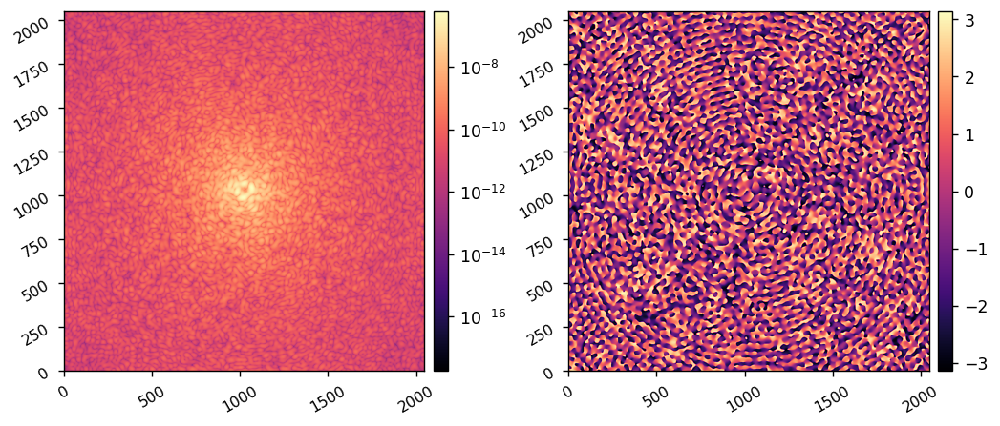

In [13]:
reload(coro)
poppy_log.disabled = False

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = coro.CORO(dm_inf='inf.fits',
              npix=128,
              oversample=16,
              use_opds=True,
#               use_opds=True,
              FPM=vortex,
              LYOT=lyot_stop,
             )
wfs = c.calc_wfs()

misc.imshow2(wfs[-1].intensity, wfs[-1].phase, lognorm1=True)

In [9]:
-2129.491+2.168440023383203E+003

38.949023383202984

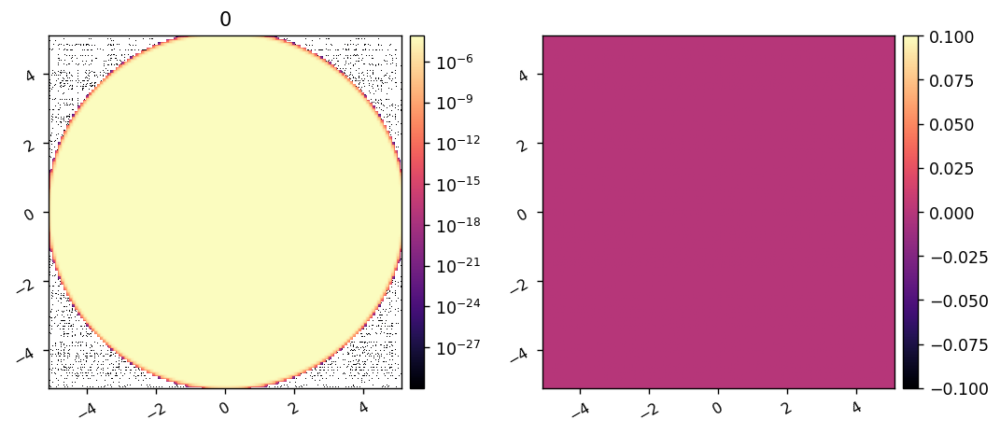

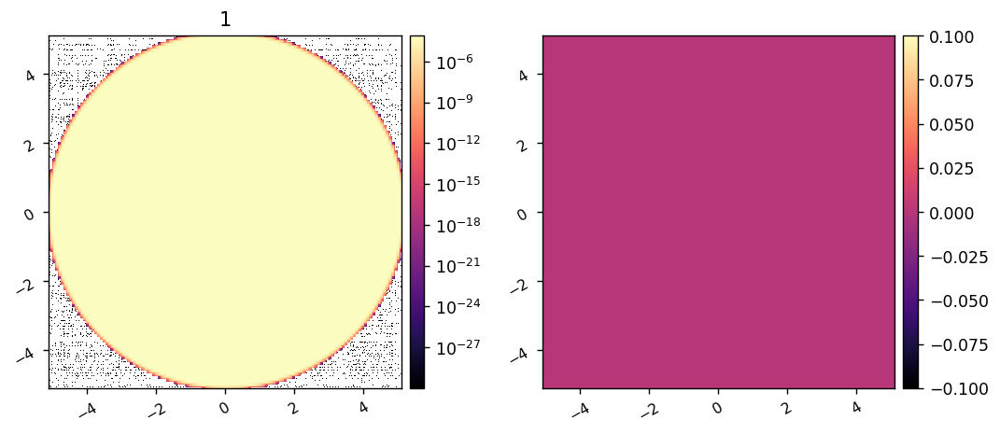

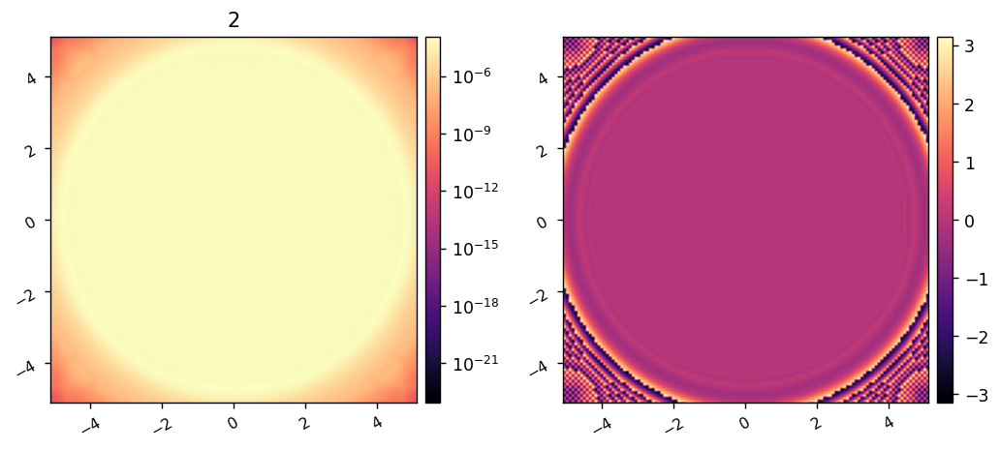

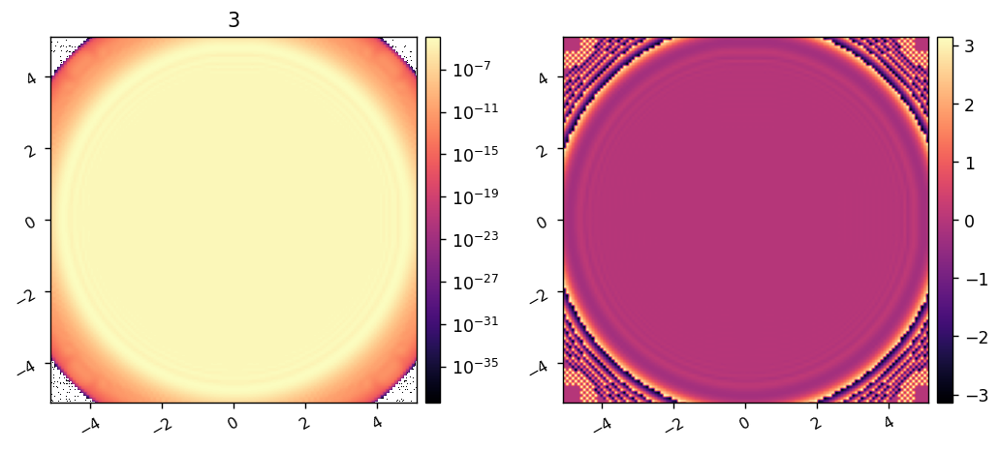

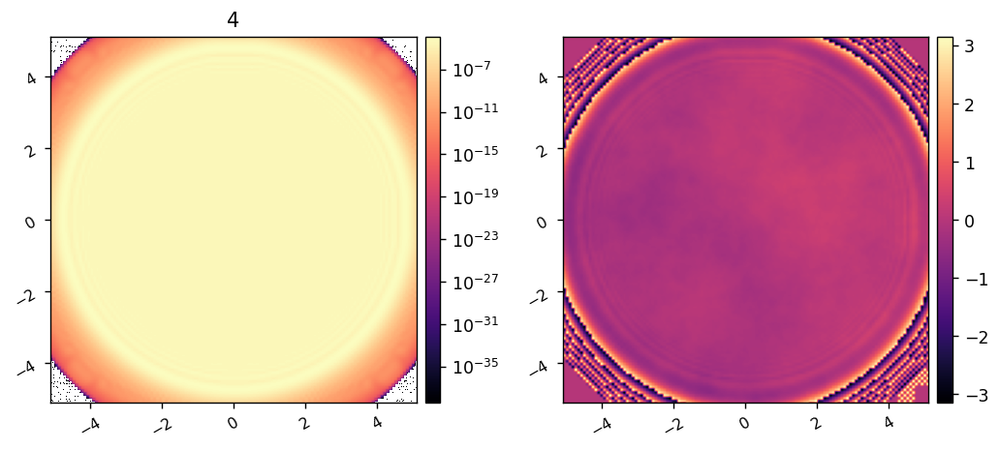

...

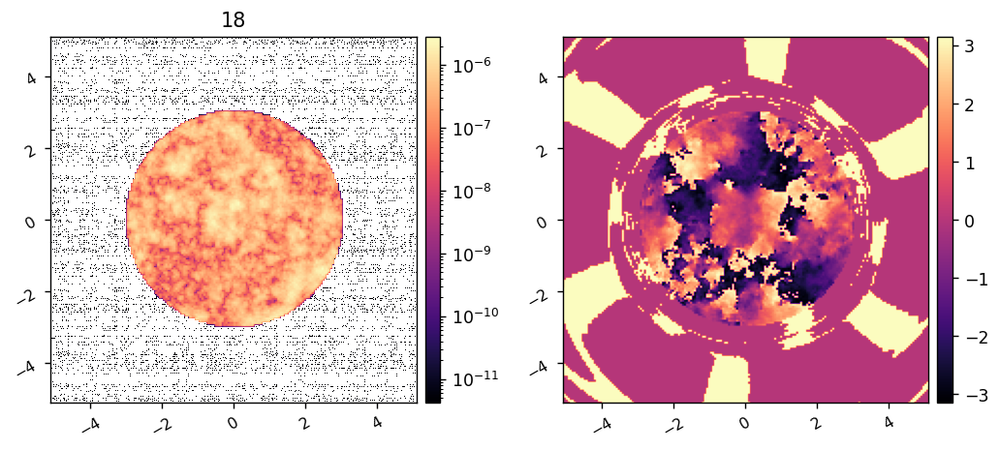

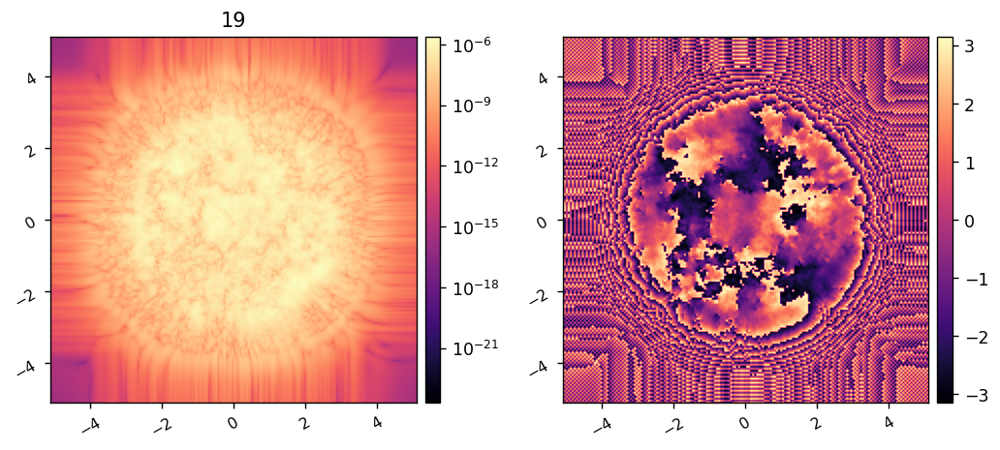

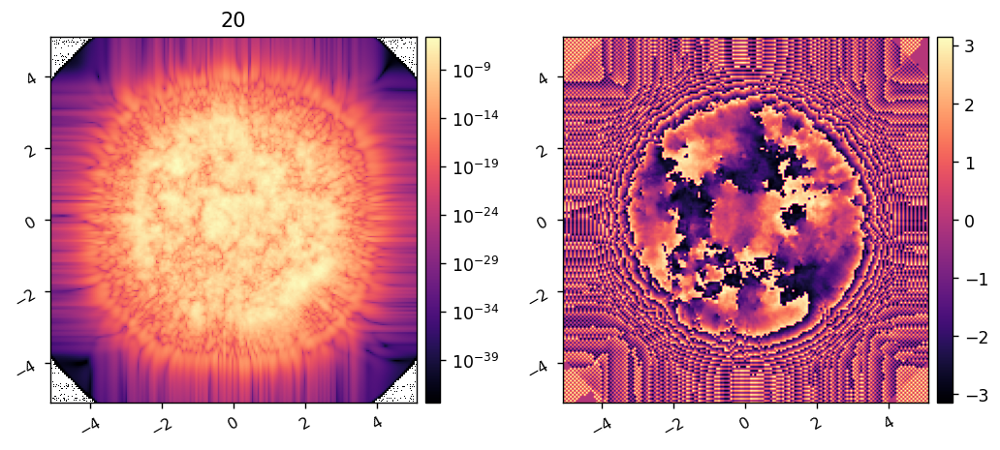

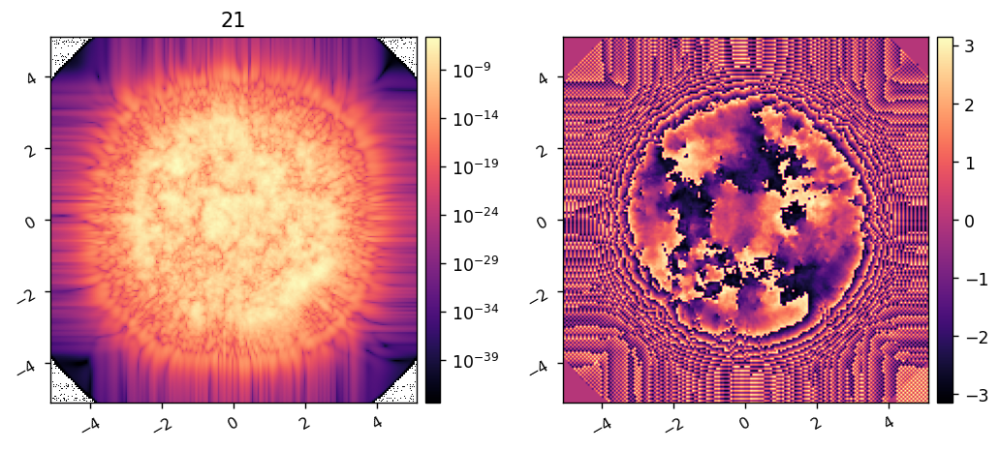

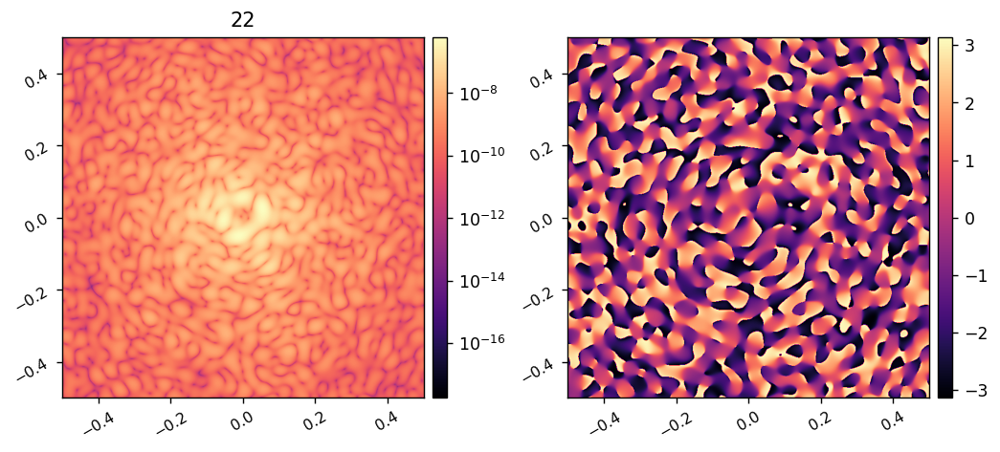

In [16]:
from IPython.display import display

pupil_lim = c.pupil_diam.value/2
fp_lim = 1/2

for i,wf in enumerate(wfs):
    if i in [c.inter_fp_index, c.fpm_index, c.image_index]:
        axlims= [-fp_lim, fp_lim, -fp_lim, fp_lim]
    else:
        axlims= [-pupil_lim, pupil_lim, -pupil_lim, pupil_lim]
    misc.imshow2(wf.intensity, wf.phase, '{:d}'.format(i), 
                 pxscl1=wf.pixelscale.to(u.mm/u.pix), pxscl2=wf.pixelscale.to(u.mm/u.pix),
                 axlims=axlims,
                 lognorm1=True,)